
##  A bout the Data

1. **Area Code:**  The numerical code of area column, type of area code is an integer.
1. **Area:** Countries and Territories (In 2019: 190 countries and 37 other territorial entities.), type of area is an object.
1. **Months Code:** The numerical code of months column, type of months code is an integer.
1. **Months:** Months, Seasons, Meteorological year, type of  months is an object.
    * Months: 'January', 'February', 'March', 'April', 'May', 'June', 'July','August', 'September', 'October', 'November', 'December'
    * Seasons: 'Dec\x96Jan\x96Feb', 'Mar\x96Apr\x96May', 'Jun\x96Jul\x96Aug','Sep\x96Oct\x96Nov'
    * Year: 'Meteorological year'
1. **Element Code:** The numerical code of element column, type of element code is an integer.
1. **Element:** 'Temperature change', 'Standard Deviation', type of element is an object.
1. **Unit:** Celsius degrees °C, type of unit is an object.

## Questions
In the first step, I determined what I curious about climate change in light of the above-mentioned information, and I wrote these down:
                                           
1. What are the ten most countries that suffer from temperature change mostly in the last ten years?
2. What are the ten countries that suffer from temperature change at the very least in the last ten years?
3. Is there any significant difference between seasons? 
4. What is the trend of temperature change in the world?

I will use python libraries within the Jupyter notebook environment for Investigation these questions. The main software libraries I’ll be importing are Pandas, NumPy for data wrangling and Matplotlib, Plotly for data visualization. 

In [31]:
import pandas as pd
import numpy as np
import imageio
import pathlib
import matplotlib.pyplot as plt
import mapclassify as mc
import numpy as np
plt.style.use('ggplot')
#data visualization
import matplotlib as mpl
import plotly.graph_objects as go
import plotly.express as px

import plotly.offline as pyo
import plotly.graph_objs as go
#visualazation libraries
import plotly.express as px
import plotly.offline as pyo
import plotly.graph_objs as go
pyo.init_notebook_mode()


In [32]:
# read data sets
df = pd.read_csv("../input/temperature-change/Environment_Temperature_change_E_All_Data_NOFLAG.csv", encoding='latin-1') # csv file is encoding as latin-1 type
df.head()

,Area Code,Area,Months Code,Months,Element Code,Element,Unit,Y1961,Y1962,Y1963,...,Y2010,Y2011,Y2012,Y2013,Y2014,Y2015,Y2016,Y2017,Y2018,Y2019
0,2,Afghanistan,7001,January,7271,Temperature change,°C,0.777,0.062,2.744,...,3.601,1.179,-0.583,1.233,1.755,1.943,3.416,1.201,1.996,2.951
1,2,Afghanistan,7001,January,6078,Standard Deviation,°C,1.950,1.950,1.950,...,1.950,1.950,1.950,1.950,1.950,1.950,1.950,1.950,1.950,1.950
2,2,Afghanistan,7002,February,7271,Temperature change,°C,-1.743,2.465,3.919,...,1.212,0.321,-3.201,1.494,-3.187,2.699,2.251,-0.323,2.705,0.086
3,2,Afghanistan,7002,February,6078,Standard Deviation,°C,2.597,2.597,2.597,...,2.597,2.597,2.597,2.597,2.597,2.597,2.597,2.597,2.597,2.597
4,2,Afghanistan,7003,March,7271,Temperature change,°C,0.516,1.336,0.403,...,3.390,0.748,-0.527,2.246,-0.076,-0.497,2.296,0.834,4.418,0.234


In [33]:
df.shape

(9656, 66)

In [34]:
df.isnull().sum()

Area Code          0
Area               0
Months Code        0
Months             0
Element Code       0
                ... 
Y2015           1295
Y2016           1308
Y2017           1290
Y2018           1307
Y2019           1291
Length: 66, dtype: int64

In [35]:
country_df = pd.read_csv('../input/temperature-change/FAOSTAT_data_11-24-2020.csv') #this csv file includes ISO-3 Country Code, this mentioned in Data Wrangling 
country_df.head()

,Country Code,Country,M49 Code,ISO2 Code,ISO3 Code,Start Year,End Year
0,2,Afghanistan,4.0,AF,AFG,NaN,NaN
1,5100,Africa,2.0,NaN,X06,NaN,NaN
2,284,Åland Islands,248.0,NaN,ALA,NaN,NaN
3,3,Albania,8.0,AL,ALB,NaN,NaN
4,4,Algeria,12.0,DZ,DZA,NaN,NaN


In [36]:
print("Months")
display(df.Months.unique())

Months


array(['January', 'February', 'March', 'April', 'May', 'June', 'July',
       'August', 'September', 'October', 'November', 'December',
       'Dec\x96Jan\x96Feb', 'Mar\x96Apr\x96May', 'Jun\x96Jul\x96Aug',
       'Sep\x96Oct\x96Nov', 'Meteorological year'], dtype=object)

In [37]:
#1. Renaming
df.rename(columns = {'Area':'Country Name'},inplace = True)

In [38]:
df.set_index('Months', inplace=True)
df.rename({'Dec\x96Jan\x96Feb': 'Winter', 'Mar\x96Apr\x96May': 'Spring', 'Jun\x96Jul\x96Aug':'Summer','Sep\x96Oct\x96Nov':'Fall'}, axis='index',inplace = True)
df.reset_index(inplace = True)

In [39]:
#2. Filtering 
df = df[df['Element'] == 'Temperature change']

In [40]:
#2. Drop unwanted columns from df_countrycode
country_df.drop(['Country Code','M49 Code','ISO2 Code','Start Year','End Year'],axis=1,inplace=True)
country_df.rename(columns = {'Country':'Country Name','ISO3 Code':'Country Code'},inplace=True)


In [41]:
#3. Merging with df to df_country
df = pd.merge(df, country_df, how='outer', on='Country Name')

In [42]:
#2. Drop some columns
df.drop(['Area Code','Months Code','Element Code','Element','Unit'],axis=1,inplace=True)

What are the ten most countries that suffer from temperature change mostly in the last ten years?

In [43]:
#3.Channing dataframe organization
df = df.melt(id_vars=["Country Code", "Country Name","Months",], var_name="year", value_name="tem_change")
df["year"] = [i.split("Y")[-1] for i in df.year]

display(df.sample(5))

,Country Code,Country Name,Months,year,tem_change
281937,NaN,Southern Africa,July,2018,1.455
192614,NZL,New Zealand,November,2000,-1.463
157017,ECU,Ecuador,July,1993,0.750
74493,GAB,Gabon,January,1976,-0.292
268406,VGB,British Virgin Islands,September,2016,0.758


In [44]:
df.dropna(inplace=True)

In [45]:
df.isnull().sum()

Country Code    0
Country Name    0
Months          0
year            0
tem_change      0
dtype: int64

In [46]:
# Convert the 'year' column to datetime format
df['year'] = pd.to_datetime(df['year'], format='%Y')

# Filter data for the last ten years
df_filtered = df[df['year'] >= pd.to_datetime('2013-01-01')]

# Calculate the average temperature change for each country
df_average_temp_change = df_filtered.groupby('Country Name')['tem_change'].mean()

# Sort the DataFrame by average temperature change in descending order
df_average_temp_change = df_average_temp_change.sort_values(ascending=False)

# Get the top 10 countries with the most temperature change
temp_countries = df_average_temp_change.reset_index()
temp_countries.head()

,Country Name,tem_change
0,Svalbard and Jan Mayen Islands,3.511697
1,Belarus,2.108445
2,Estonia,2.086681
3,Slovenia,2.080723
4,Austria,2.071319


In [47]:
# Sort the DataFrame by temperature change in descending order
df_sorted = temp_countries.sort_values(by='tem_change', ascending=False)
# Separate into highest and lowest countries
highest_countries = df_sorted.head(10)  # Adjust the number as needed
lowest_countries = df_sorted.tail(10)   # Adjust the number as needed

# Highest Countries
**What are the ten most countries that suffer from temperature change mostly in the last ten years?**

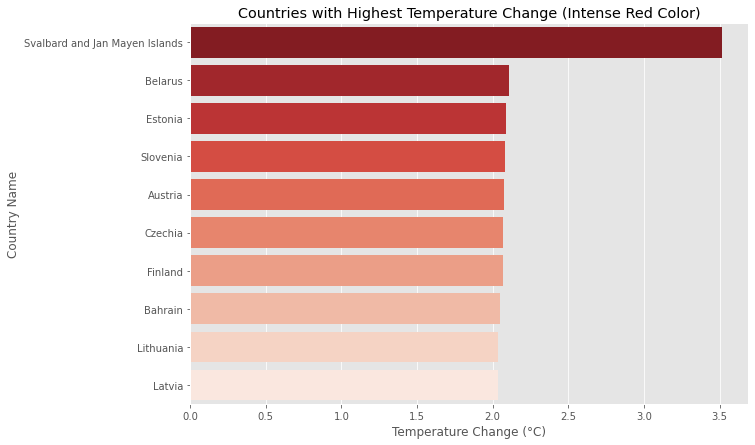

In [48]:
# Bar plot for highest countries with more intense red color
import seaborn as sns 
plt.figure(figsize=(10, 7))
sns.barplot(x=highest_countries['tem_change'], y=highest_countries['Country Name'], palette='Reds_r')
plt.title('Countries with Highest Temperature Change (Intense Red Color)')
plt.xlabel('Temperature Change (°C)')
plt.ylabel('Country Name')
plt.show()


# Lowest Countries
**What are the ten countries that suffer from temperature change at the very least in the last ten years?**

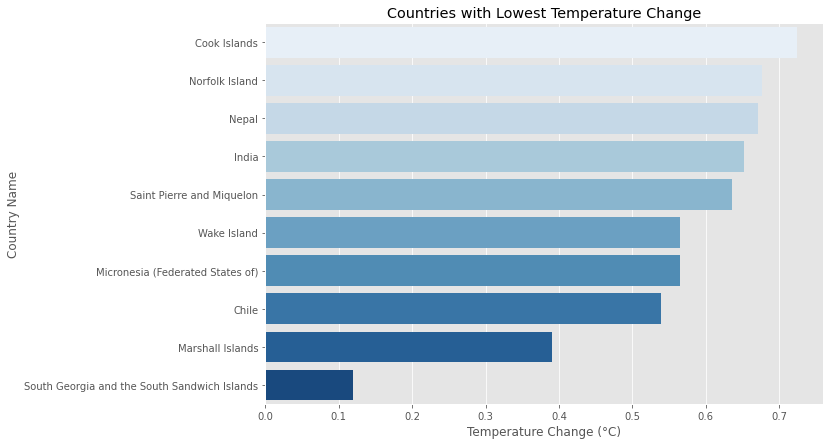

In [49]:
# Bar plot for lowest countries
plt.figure(figsize=(10, 7))
sns.barplot(x=lowest_countries['tem_change'], y=lowest_countries['Country Name'], palette='Blues')
plt.title('Countries with Lowest Temperature Change')
plt.xlabel('Temperature Change (°C)')
plt.ylabel('Country Name')
plt.show()

# Highest Countries && Lowest Countries

/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:3: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



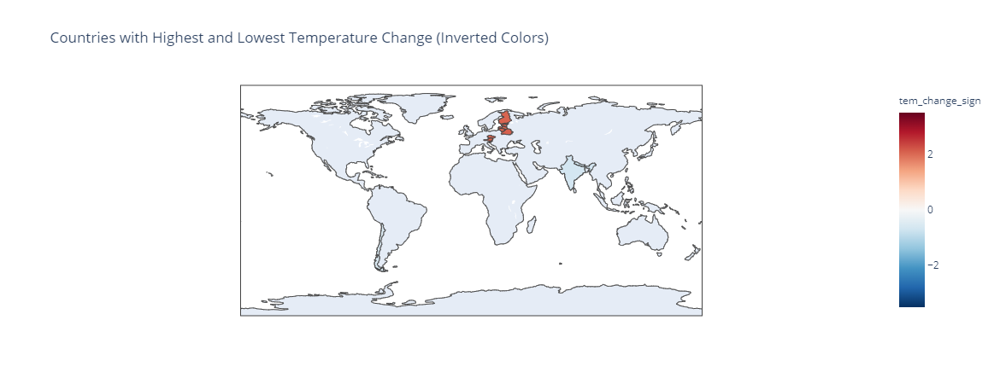

In [50]:
# Add a sign to the temperature change for positive/negative differentiation
highest_countries['tem_change_sign'] = highest_countries['tem_change']
lowest_countries['tem_change_sign'] = lowest_countries['tem_change'] * -1
# Concatenate the DataFrames
combined_df = pd.concat([highest_countries, lowest_countries])

# Create choropleth map for both highest and lowest countries with inverted colors
fig_combined = px.choropleth(
    combined_df,
    locations=combined_df['Country Name'],
    locationmode='country names',
    color=combined_df['tem_change_sign'],
    color_continuous_scale='RdBu_r',  # Use 'RdBu_r' for inverted colors
    color_continuous_midpoint=0,      # Set midpoint to 0 to have white color for zero temperature change
    title='Countries with Highest and Lowest Temperature Change (Inverted Colors)'
)

# Show the combined map
fig_combined.show()

# Is there any significant difference between seasons? 

In [51]:
from scipy.stats import f_oneway

# Perform ANOVA
anova_result = f_oneway(
    df['tem_change'][df['Months'] == 'Winter'],
    df['tem_change'][df['Months'] == 'Spring'],
    df['tem_change'][df['Months'] == 'Summer'],
    df['tem_change'][df['Months'] == 'Fall'],
    df['tem_change'][df['Months'] == 'Meteorological year']
)

# Print ANOVA result
print("ANOVA p-value:", anova_result.pvalue)

# Check if p-value is significant (e.g., p < 0.05)
if anova_result.pvalue < 0.05:
    print("There is a significant difference between seasons.")
else:
    print("No significant difference between seasons.")


ANOVA p-value: 4.5255782200100006e-27
There is a significant difference between seasons.


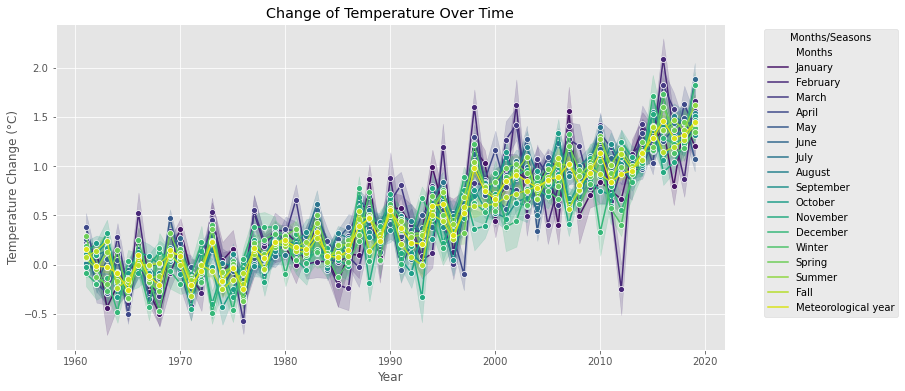

In [52]:
plt.figure(figsize=(12, 6))
sns.lineplot(x='year', y='tem_change', hue='Months', data=df, marker='o', palette='viridis')
plt.title('Change of Temperature Over Time')
plt.xlabel('Year')
plt.ylabel('Temperature Change (°C)')
plt.legend(title='Months/Seasons', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.show()

# What is the trend of temperature change in the world?

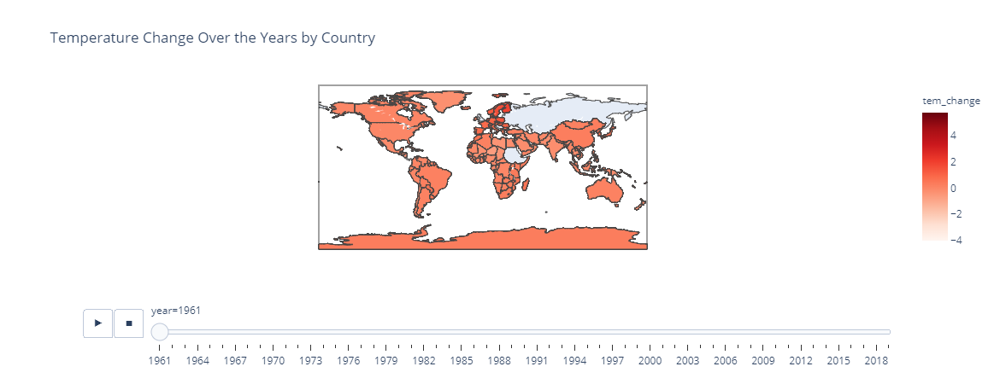

In [54]:
import plotly.express as px
# Convert 'year' column to string
df['year'] = df['year'].dt.strftime('%Y')
# Example code for a choropleth map with red color scale
fig = px.choropleth(df, 
                    locations='Country Code',
                    color='tem_change',
                    animation_frame='year',
                    title='Temperature Change Over the Years by Country',
                    color_continuous_scale='Reds')  # Set color to red

fig.show()


<a id = "5"></a><br>
## References

 https://www.ipcc.ch/sr15/chapter/chapter-1/ <br>
<br>
 http://www.fao.org/faostat/en/#data/ET <br>

http://www.fao.org/faostat/en/#definitions 
<br>
 https://ocw.mit.edu
<br>
 https://climate.nasa.gov/resources/global-warming-vs-climate-change/
<br>
[https://climate.nasa.gov/effects/
<br>
 https://www.scientificamerican.com/article/in-just-10-years-warming-has-increased-the-odds-of-disasters/
<br>
 https://www.deepdyve.com/lp/wiley/climate-change-impacts-on-wildlife-in-a-high-arctic-archipelago-zKjAbf0Y5t 
<br>
https://unfccc.int/parties-observers#:~:text=Annex%20I%20Parties%20include%20the,Central%20and%20Eastern%20European%20States
<br>
 https://www.nasa.gov/press-release/nasa-noaa-data-show-2016-warmest-year-on-record-globally
<br>

